## Step0: Load And Visualize Training Data

### Load the training data and display some attributes of data

In [1]:
import numpy as np
import glob
import matplotlib.image as mpimg

car_images = glob.glob('../vehicles/vehicles/**/*.png')
noncar_images = glob.glob('../non-vehicles/non-vehicles/**/*.png')

data_info = {}
data_info['car_images_cnt'] = len(car_images)
data_info['noncar_images_cnt'] = len(noncar_images)
image = mpimg.imread(car_images[0])
data_info['image_shape'] = image.shape
data_info['image_dtype'] = image.dtype
data_info['max_pix_val'] = np.max(image)
data_info['min_pix_val'] = np.min(image)



print(data_info)

{'max_pix_val': 0.75294119, 'image_shape': (64, 64, 3), 'image_dtype': dtype('float32'), 'car_images_cnt': 8792, 'min_pix_val': 0.12941177, 'noncar_images_cnt': 8968}


### Visualize some positive and negative examples

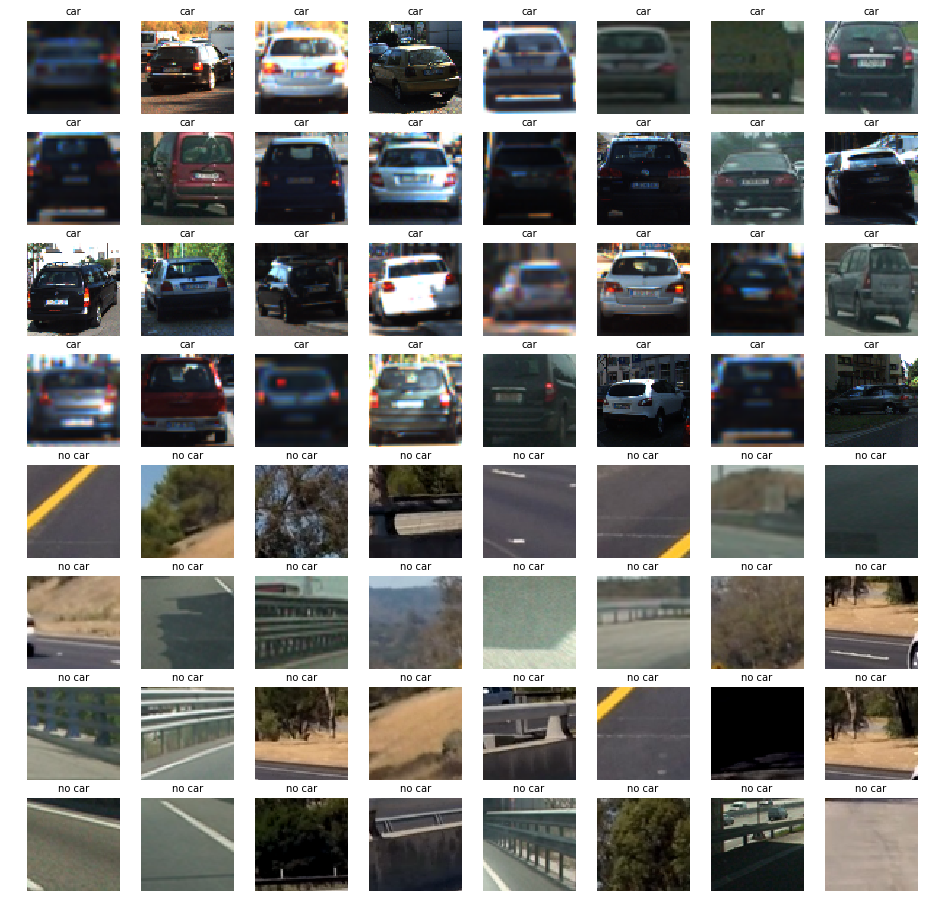

In [2]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(8,8, figsize=(16, 16))
axs = axs.ravel()

# Step through the list and search for chessboard corners
for i in range(0,32):
    img = mpimg.imread(car_images[np.random.randint(0,len(car_images))])
    axs[i].axis('off')
    axs[i].set_title('car', fontsize=10)
    axs[i].imshow(img)
for i in range(32,64):
    img = mpimg.imread(noncar_images[np.random.randint(0,len(car_images))])
    axs[i].axis('off')
    axs[i].set_title('no car', fontsize=10)
    axs[i].imshow(img)
plt.show()

## Step1: Feature Extraction
### Method to get histogram of gradients

In [3]:
from skimage.feature import hog

'''
Function to extract histogram features from a singel channel image
Inputs: Image (Mono channel)
        Orientation bins
        Pixels per cell
        Cells per block
        Flag to visualize features
        Flat to return features as a vector
Outputs: features
        (optional) hog image to visualize features
'''
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

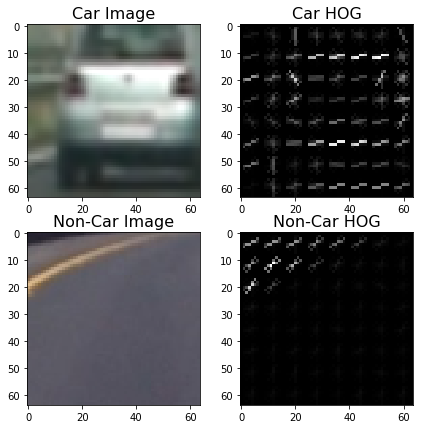

In [4]:
#Visualize some hog features for car and non car images

car_img = mpimg.imread(car_images[100])
_, car_hog = get_hog_features(car_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
noncar_img = mpimg.imread(noncar_images[100])
_, noncar_hog = get_hog_features(noncar_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)

# Visualize 
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(7,7))
ax1.imshow(car_img)
ax1.set_title('Car Image', fontsize=16)
ax2.imshow(car_hog, cmap='gray')
ax2.set_title('Car HOG', fontsize=16)
ax3.imshow(noncar_img)
ax3.set_title('Non-Car Image', fontsize=16)
ax4.imshow(noncar_hog, cmap='gray')
ax4.set_title('Non-Car HOG', fontsize=16)

plt.show()

### Method to extract color historgram

In [5]:
# Define a function to compute color histogram features  
'''
Function to extract color histogram featuresfrom an image
Inputs: Image
        Number of bins
        Range of bins
Outputs: features
'''
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

### Method to extract binned color features

In [6]:
import cv2
# Define a function to compute binned color features  
'''
Function to extract binned color features from an image
Inputs: Image
        Bin size as tuple
Outputs: features
'''
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

### Combined Function to extract features from a list of images

In [7]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist() and get_hog_features()
'''
Function to extract all features from input image depending on the configuration as given in input.
Inputs: Image
        Dictonary stating what features to use
        Color space
        Bin size as tuple
        Color Histogram bins
        Color Histogram Range
        Number of channels to be used to get HOG features
        Number of orientations to be used to get HOG features
        pixels per cell to be used to get HOG features
        cells per block to be used to get HOG features
Outputs: features
'''
def extract_features(imgs, features_used, cspace='RGB', spatial_size=(32, 32),hist_bins=32, 
                     hist_range=(0, 256), hog_channel = 'ALL', orient = 9, pix_per_cell = 8, cell_per_block = 2):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image_in = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image_in = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image_in = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image_in = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        else: 
            feature_image_in = np.copy(image)      
        
        features_current_img = []
        
        # Apply bin_spatial() to get spatial color features
        if features_used['spatial']:
            spatial_features = bin_spatial(feature_image_in, size=spatial_size)
            features_current_img.append(spatial_features)
        
        # Apply color_hist() also with a color space option now
        if features_used['hist']:
            hist_features = color_hist(feature_image_in, nbins=hist_bins, bins_range=hist_range)
            features_current_img.append(hist_features)
        
        # Call get_hog_features() with vis=False, feature_vec=True
        if features_used['hog']:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image_in.shape[2]):
                    hog_features.append(get_hog_features(feature_image_in[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image_in[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            features_current_img.append(hog_features)
            
        # Append the new feature vector to the features list
        features.append(np.concatenate(features_current_img))
    # Return list of feature vectors
    return features

## Step3: Build Classifiers

### Split data in training and test

In [8]:
# Split up data into randomized training and test sets
from sklearn.model_selection import train_test_split
def split_up_data(X, y, test_data_size = 0.2, rand_state = None):
    if rand_state == None:
        rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_data_size, random_state=rand_state)
    split_data = {}
    split_data['X_train'] = X_train
    split_data['y_train'] = y_train
    split_data['X_test'] = X_test
    split_data['y_test'] = y_test
    return split_data


### Exploration Space

Define exploration space for
1. color spaces
2. possible combination of features
3. spatial bins
4. histogram bins
5. orienations
6. pixels per cell
7. cells per block and hog channels.

In [9]:
possible_color_spaces = ['YUV','HSV','HLS','LUV']

possible_features = []
possible_features.append({'spatial':True,'hist' : True,'hog' : True})
possible_features.append({'spatial':False,'hist' : False,'hog' : True})
possible_features.append({'spatial':False,'hist' : True,'hog' : True})
possible_features.append({'spatial':True,'hist' : False,'hog' : True})

possible_spatialbins = [16,8]

possible_histbins = [16,8]

possible_orientations = [9,11,7]
possible_pixels_per_cell = [8,16]
possible_cells_per_block = [2]
possible_hog_channels = [0,3]


### Create all possible features combinations

In [10]:
import pandas as pd

total_color_spaces = len(possible_color_spaces)
total_hog_combos = len(possible_orientations)*len(possible_pixels_per_cell)*len(possible_cells_per_block)*len(possible_hog_channels)
total_spatial_combos = len(possible_spatialbins)
total_hist_combos = len(possible_histbins)

total_combinations = total_hog_combos*total_color_spaces*(total_spatial_combos*total_hist_combos + total_hist_combos + total_spatial_combos + 1)

hog_list = []
for orient in possible_orientations:
    for pixels_per_cell in possible_pixels_per_cell:
        for cells_per_block in possible_cells_per_block:
            for hog_channels in possible_hog_channels:
                hog_list.append({'orient':orient,'pixels_per_cell':pixels_per_cell,'cells_per_block':cells_per_block,'hog_channels':hog_channels})

spatial_list =[]        
for spatialbins in possible_spatialbins:
    spatial_list.append({'spatialbins':spatialbins})
        
histbins_list =[]        
for histbins in possible_histbins:
    histbins_list.append({'histbins':histbins})

color_spaces_list = []
for color_spaces in possible_color_spaces:
    color_spaces_list.append({'color_spaces':color_spaces})
    

combinations = []
for features in possible_features:
    if features['hog'] and features['spatial'] and features['hist']:
        for color_dict in color_spaces_list:
            for hog_dict in hog_list:
                for hist_dict in histbins_list:
                    for spatial_dict in spatial_list:
                        combinations.append({**features, **color_dict, **hog_dict, **hist_dict, **spatial_dict})
    if features['hog'] and features['spatial'] == False and features['hist']:
        for color_dict in color_spaces_list:
            for hog_dict in hog_list:
                for hist_dict in histbins_list:
                    combinations.append({**features, **color_dict, **hog_dict, **hist_dict})
            
    if features['hog'] and features['spatial'] and features['hist'] == False:
        for color_dict in color_spaces_list:
            for hog_dict in hog_list:
                for spatial_dict in spatial_list:
                    combinations.append({**features, **color_dict, **hog_dict, **spatial_dict})
    
    if features['hog'] and features['spatial'] == False and features['hist'] == False:
        for color_dict in color_spaces_list:
            for hog_dict in hog_list:
                combinations.append({**features, **color_dict, **hog_dict})
    
assert len(combinations) == total_combinations, 'Some combinations missing'
combinations_df = pd.DataFrame(combinations)  
combinations_df.to_csv('Combinations.csv')


    

 ### Run for all combinations and train a linear SVM (with hinge loss)
 
Following steps are followed
1. Current combination in the search is loaded
2. Depending on the current combinations, features are extracted
3. Features are normalized
4. Data is splitted into train and test
5. Linear SVM with hinge loss is trained on train data and tested on test data
6. Model with best accuracy is stored.

In [11]:
import time
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
import warnings

time_traing_val = np.zeros((total_combinations,2))
score_traing_val = np.zeros((total_combinations,2))

min_accuracy_to_break = 0.97

warnings.simplefilter("error", RuntimeWarning)

for index, row in combinations_df.iterrows():
    print('On combination', index, 'of',total_combinations)
    in_features_used = {'hog':row['hog'], 'spatial': row['spatial'],'hist':row['hist']}
    in_cspace = row['color_spaces']
    if row['spatial']:
        in_spatial_size = (int(row['spatialbins']), int(row['spatialbins']))
    else:
        in_spatial_size = (None,None)
    if row['hist']:
        in_hist_bins = int(row['histbins'])
    else:
        in_hist_bins = None
    in_hist_range = (0,256)
    if row['hog_channels'] == 3:
        in_hog_channel = 'ALL'
    else:
        in_hog_channel = int(row['hog_channels'])
    in_orient = row['orient']
    in_pix_per_cell = row['pixels_per_cell']
    in_cell_per_block = row['cells_per_block']
    try:
        car_features = extract_features(car_images, in_features_used, in_cspace, 
                     in_spatial_size, in_hist_bins, in_hist_range, in_hog_channel,
                    in_orient, in_pix_per_cell, in_cell_per_block)
        notcar_features = extract_features(noncar_images, in_features_used, in_cspace, 
                     in_spatial_size, in_hist_bins, in_hist_range, in_hog_channel,
                    in_orient, in_pix_per_cell, in_cell_per_block)
    except RuntimeWarning:
        print('Features not extracted properly, continuing to next combination')
        continue
        
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))
    
    # Apply the scaler to X
    X_scaler = StandardScaler().fit(X)
    scaled_X = X_scaler.transform(X)
    
    # Split up data into randomized training and test sets
    rand_state = 10
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)    
    
    # Check the training time for the SVC
    t=time.time()
    svc = LinearSVC(loss='hinge')
    svc.fit(X_train, y_train)
    t2 = time.time()
    
    time_traing_val[index,0] = round(t2-t, 2)
    
    # Check the score of the SVC
    score_traing_val[index,0] =  round(svc.score(X_train, y_train), 4)
    score_traing_val[index,1] =  round(svc.score(X_test, y_test), 4)
    print('Test score',score_traing_val[index,1])
    if score_traing_val[index,1] > min_accuracy_to_break:
        print('Model found. Saving it...')
        svc_model = {}
        svc_model['svc'] = svc
        svc_model['scaler'] = X_scaler
        svc_model['orient'] = in_orient
        svc_model['pix_per_cell'] = in_pix_per_cell
        svc_model['cell_per_block'] = in_cell_per_block
        svc_model['spatial_size'] = in_spatial_size
        svc_model['hist_bins'] = in_hist_bins
        svc_model['cspace'] = in_cspace
        svc_model['features_used'] = in_features_used
        svc_model['hog_channel'] = in_hog_channel
        pickle_out = open("svc_pickle.p","wb")
        pickle.dump(svc_model, pickle_out)
        pickle_out.close()
        print('Model saved.')
        min_accuracy_to_break = score_traing_val[index,1]
        model_index = index
    
    # Check the prediction time for a single sample
    t=time.time()
    n_predict = 10
    test_predict = svc.predict(X_test[0:n_predict])
    t2 = time.time()
    time_traing_val[index,1] = round(t2-t, 5)
    

On combination 0 of 432
Test score 0.9744
Model found. Saving it...
Model saved.
On combination 1 of 432
Test score 0.9724
On combination 2 of 432
Test score 0.9744
On combination 3 of 432
Test score 0.9721
On combination 4 of 432
Features not extracted properly, continuing to next combination
On combination 5 of 432
Features not extracted properly, continuing to next combination
On combination 6 of 432
Features not extracted properly, continuing to next combination
On combination 7 of 432
Features not extracted properly, continuing to next combination
On combination 8 of 432
Test score 0.9654
On combination 9 of 432
Test score 0.9721
On combination 10 of 432
Test score 0.9657
On combination 11 of 432
Test score 0.9713
On combination 12 of 432
Features not extracted properly, continuing to next combination
On combination 13 of 432
Features not extracted properly, continuing to next combination
On combination 14 of 432
Features not extracted properly, continuing to next combination
On c

In [27]:
print('Model chosen has following parameters')
print('Training Accuracy:',score_traing_val[model_index,0],'Validation Accuracy:',score_traing_val[model_index,1])
print('Training Time:',time_traing_val[model_index,0],'sec. Prediction Time:',"{0:.5f}".format(time_traing_val[model_index,1]),'sec')
print(combinations_df.iloc[[model_index]])


Model chosen has following parameters
Training Accuracy: 1.0 Validation Accuracy: 0.989
Training Time: 4.43 sec. Prediction Time: 0.00000 sec
    cells_per_block color_spaces  hist  histbins   hog  hog_channels  orient  \
68                2          HSV  True      16.0  True             3      11   

    pixels_per_cell spatial  spatialbins  
68                8    True         16.0  


### Save the features for the particular combination

In [24]:
svc_model = pickle.load( open("svc_pickle.p", "rb" ) )
in_features_used = svc_model['features_used']
in_cspace = svc_model["cspace"]
in_spatial_size = svc_model["spatial_size"]
in_hist_bins = svc_model["hist_bins"]
in_hist_range = (0,256) 
in_hog_channel = svc_model['hog_channel']
in_orient = svc_model["orient"]
in_pix_per_cell = svc_model["pix_per_cell"]
in_cell_per_block = svc_model["cell_per_block"]
X_scaler = svc_model["scaler"]


car_features = extract_features(car_images, in_features_used, in_cspace, 
                     in_spatial_size, in_hist_bins, in_hist_range, in_hog_channel,
                    in_orient, in_pix_per_cell, in_cell_per_block)
notcar_features = extract_features(noncar_images, in_features_used, in_cspace, 
                 in_spatial_size, in_hist_bins, in_hist_range, in_hog_channel,
                in_orient, in_pix_per_cell, in_cell_per_block)

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Apply the scaler to X
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

print(scaled_X.shape)

# Split up data into randomized training and test sets
rand_state = 10
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)    

split_data = {}
split_data['X_train'] = X_train
split_data['y_train'] = y_train
split_data['X_test'] = X_test
split_data['y_test'] = y_test

pickle_out = open("features_pickle.p","wb")
pickle.dump(split_data, pickle_out)
pickle_out.close()
print('Features saved.')

(17760, 7284)
Features saved.


### Using the saved features also train a decision tree and SVM with Gaussian Kernel

In [45]:
from sklearn import tree
from sklearn import svm

svc_model = pickle.load( open("svc_pickle.p", "rb" ) )

split_data = pickle.load( open("features_pickle.p", "rb" ) )
X_train = split_data['X_train']
y_train = split_data['y_train']
X_test = split_data['X_test']
y_test = split_data['y_test']

clf = tree.DecisionTreeClassifier(min_samples_split = 5)
clf.fit(X_train, y_train)
print('Test score',round(clf.score(X_test, y_test), 4))
svc_model['dt'] = clf

clf = svm.SVC()
clf.fit(X_train, y_train)
print('Test score',round(clf.score(X_test, y_test), 4))
svc_model['svc_gauss'] = clf

pickle_out = open("svc_pickle.p","wb")
pickle.dump(svc_model, pickle_out)
pickle_out.close()
print('DT and gaussian models saved.')

Test score 0.9505
Test score 0.9927
DT Model saved.


## Step3: Use classifiers for prediction

### Define region for search using the sliding window approach.

In [11]:
'''
Function to define search space using the sliding window approach 
Inputs: Image
        Y Start
        Y Stop
        Scale 
Ouptut: Image with Rectangles drawn for seach regions    
'''

def define_search_space(img, ystart, ystop, scale, overlap):
    
    rectangles = []
    
    ctrans_tosearch = img[ystart:ystop,:,:]
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    
    # Compute the span of the region to be searched    
    xspan = ctrans_tosearch.shape[1]
    yspan = ctrans_tosearch.shape[0]
    
    # Compute the number of pixels per step in x/y
    window = 64
    xy_window=(window, window)
    xy_overlap=(overlap, overlap)
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step
            endy = starty + xy_window[1]
            
            
            xleft = startx
            ytop = starty

            xbox_left = np.int(xleft*scale)
            ytop_draw = np.int(ytop*scale)
            win_draw = np.int(window*scale)
            rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))    
    
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in rectangles:
        # Draw a rectangle given bbox coordinates
        color = np.uint8(np.random.uniform(0, 255, 3))
        c = tuple(map(int, color))
        cv2.rectangle(imcopy, bbox[0], bbox[1], color = c, thickness = 3)
    # Return the image copy with boxes drawn
    return imcopy

Testing for 
ystart = 380
ystop = 500
scale = 1.0

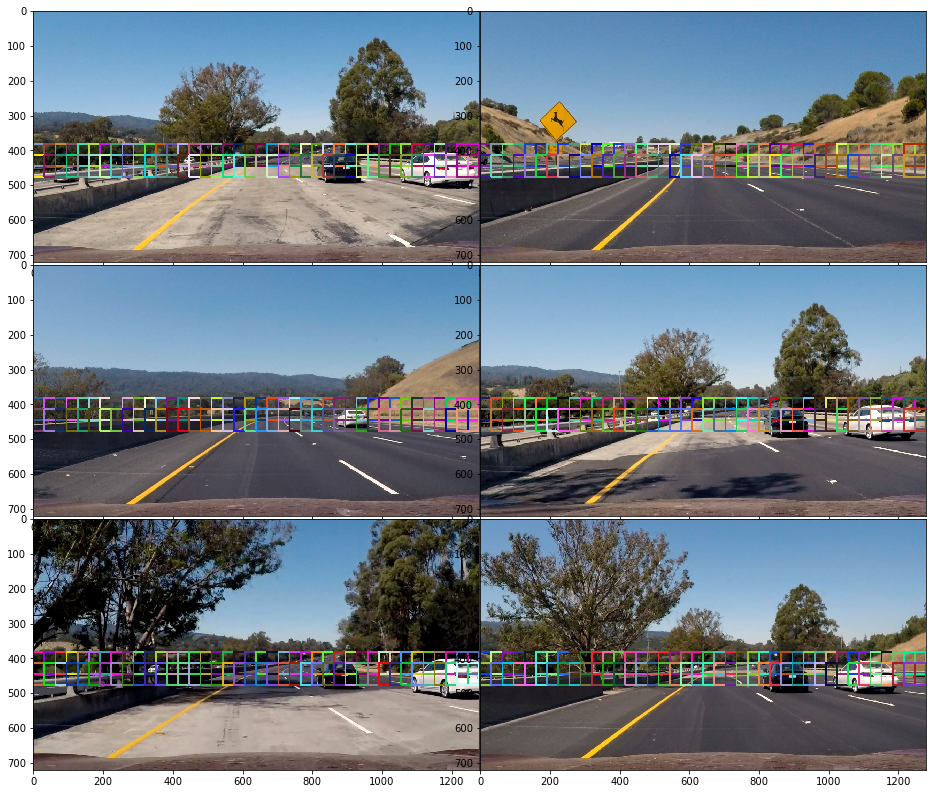

In [14]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

ystart = 380
ystop = 500
scale = 1.0
overlap = 0.5

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    test_img_rects = define_search_space(test_img, ystart, ystop, scale,overlap = 0.5)
    axs[i].imshow(test_img_rects)
plt.show()

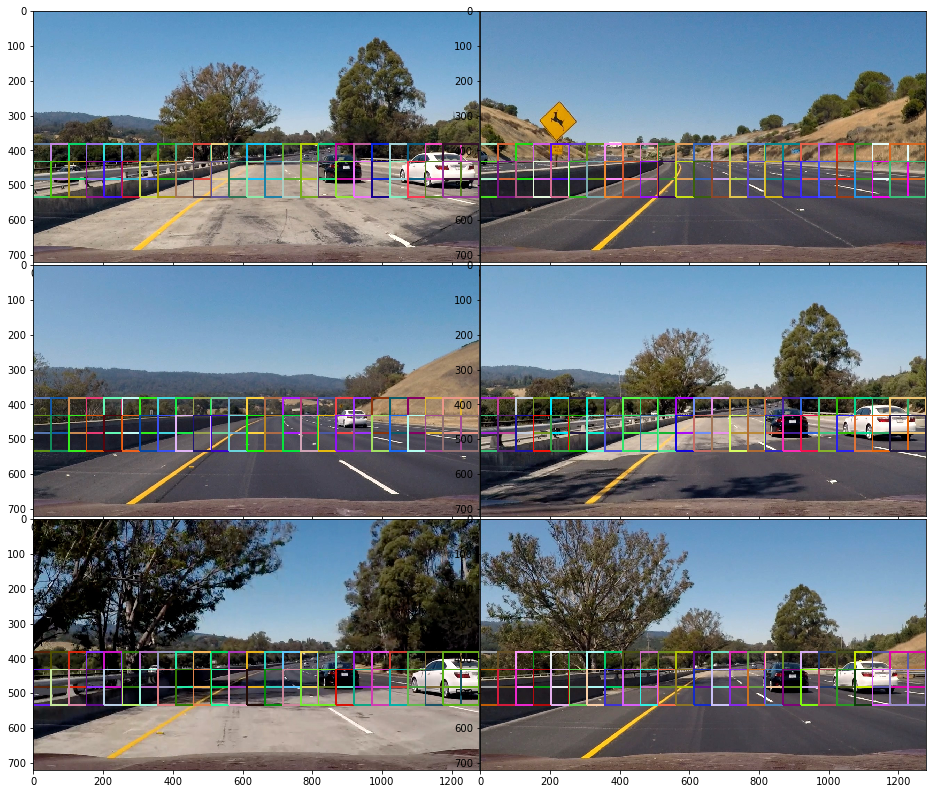

In [15]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

ystart = 380
ystop = 550
scale = 1.6
overlap = 0.5

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    test_img_rects = define_search_space(test_img, ystart, ystop, scale, overlap = 0.5)
    axs[i].imshow(test_img_rects)
plt.show()

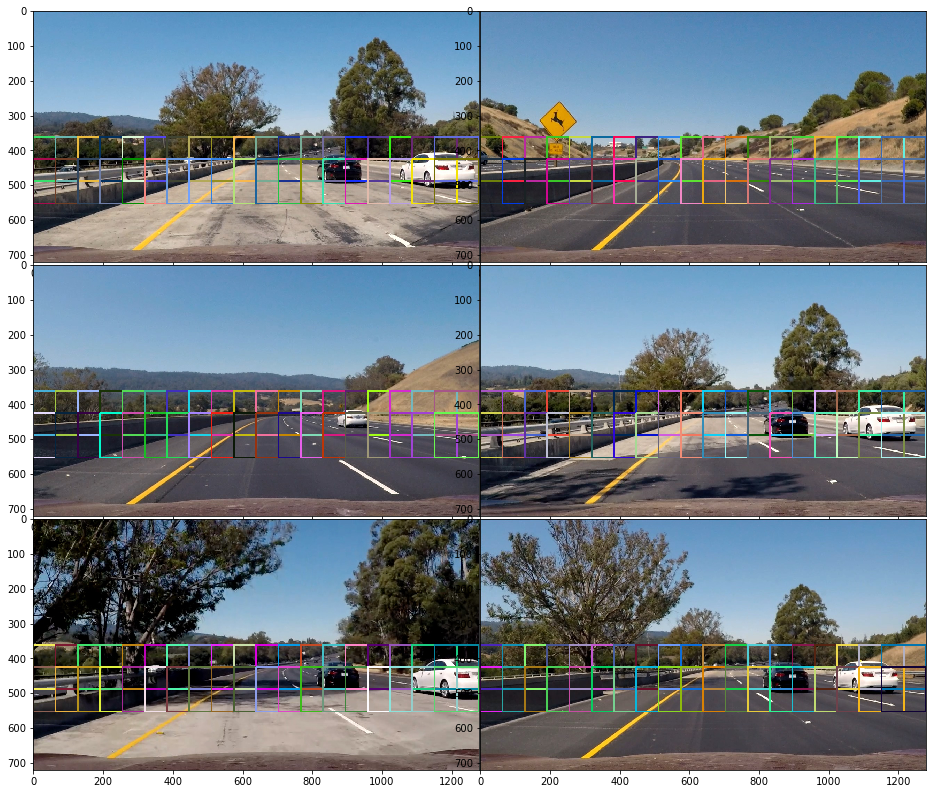

In [16]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

ystart = 360
ystop = 570
scale = 2.0
overlap = 0.5

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    test_img_rects = define_search_space(test_img, ystart, ystop, scale, overlap = 0.5)
    axs[i].imshow(test_img_rects)
plt.show()

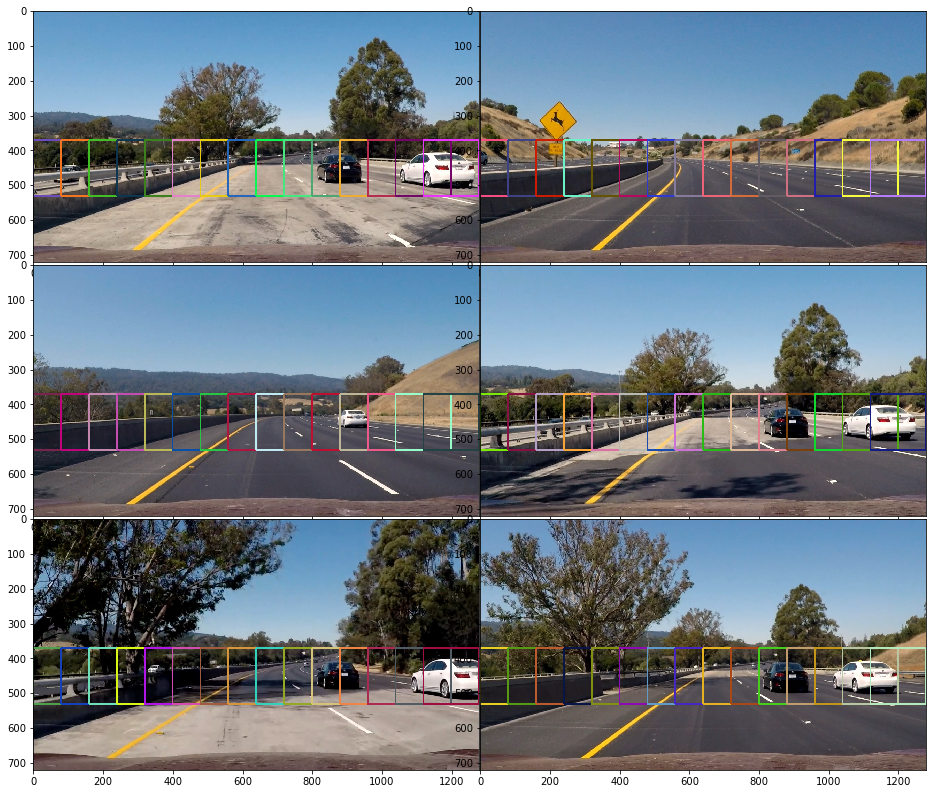

In [17]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

ystart = 370
ystop = 590
scale = 2.5
overlap = 0.5

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    test_img_rects = define_search_space(test_img, ystart, ystop, scale, overlap = 0.5)
    axs[i].imshow(test_img_rects)
plt.show()

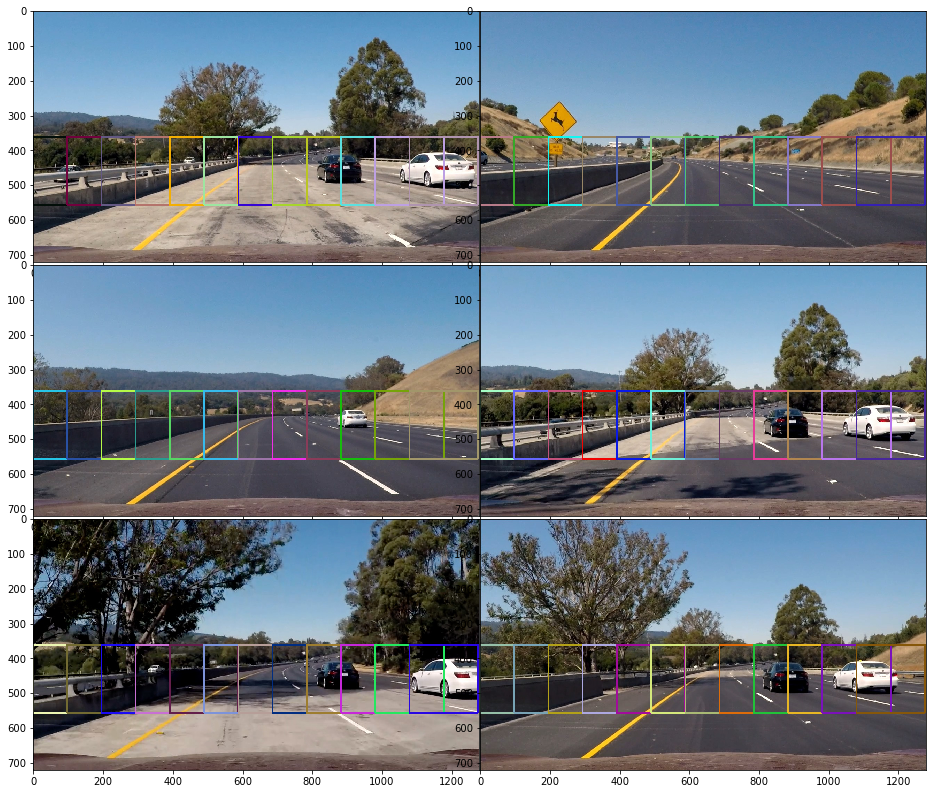

In [18]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

ystart = 360
ystop = 630
scale = 3.07
overlap = 0.5

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    test_img_rects = define_search_space(test_img, ystart, ystop, scale, overlap = 0.5)
    axs[i].imshow(test_img_rects)
plt.show()

### Find cars function implements steps to find car using the sliding window approach
1. Using the y start, y stop and scale, defines the search space using the sliding window approach.
2. Extract features depending on the input parameters given for window current being searched
2. Normalize the extracted features
3. Use the normalized features for prediction using and of two classifiers
4. If prediction from both is true, then store the current window in the rectangles

In [19]:
# Define a single function that can extract features using hog sub-sampling and make predictions
'''
Function to find cars using the sliding window approach 
Inputs: Image
        Y Start
        Y Stop
        Scale if search
        Classifier 1
        Classifier 2
        Scaler to normalize features
        orient bins for HOG
        pix_per_cell for HOG
        cell_per_block for HOG 
        spatial_size
        hist_bins
        color space
Ouptut: Rectangles for regions where cars are found        
'''

def find_cars(img, ystart, ystop, scale, clf1, clf2, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, cspace, overlap):
    
    rectangles = []
    
    img = img.astype('float32')/255
    
    img_tosearch = img[ystart:ystop,:,:]
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: 
        ctrans_tosearch = np.copy(img)   
        
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    
    
    # Compute the span of the region to be searched    
    xspan = ch1.shape[1]
    yspan = ch1.shape[0]
    
    # Compute the number of pixels per step in x/y
    window = 64
    xy_window=(window, window)
    xy_overlap=(overlap, overlap)
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    
    # Compute individual channel HOG features for the entire image
    #hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step
            endy = starty + xy_window[1]
            
            
            # Extract HOG for this patch
            #hog_feat1 = hog1[starty:endy, startx:endx].ravel() 
            #hog_feat2 = hog2[starty:endy, startx:endx].ravel() 
            #hog_feat3 = hog3[starty:endy, startx:endx].ravel() 
            
            hog_feat1 = get_hog_features(ch1[starty:endy, startx:endx], orient, pix_per_cell, cell_per_block, feature_vec=False).ravel() 
            hog_feat2 = get_hog_features(ch2[starty:endy, startx:endx], orient, pix_per_cell, cell_per_block, feature_vec=False).ravel() 
            hog_feat3 = get_hog_features(ch3[starty:endy, startx:endx], orient, pix_per_cell, cell_per_block, feature_vec=False).ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = startx
            ytop = starty

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features,hist_features,hog_features)).reshape(1, -1))
            #test_features = hog_features.reshape(1,-1)
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction1 = clf1.predict(test_features)
            test_prediction2 = clf2.predict(test_features)
            if test_prediction1 == 1 and test_prediction2 == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))    
    return rectangles
    

In [20]:
'''
Function to draw boxes
Inputs: Image
        List of boxes to be drawn
        Color
        Thickness
Ouptut: Image with boxes drawn     
'''
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color = color, thickness = thick)
    # Return the image copy with boxes drawn
    return imcopy

### Process image implements the car finding pipeline in an image

The function implements following steps
1. Load the classifier and parameters for feature extraction.
2. Call find cars function for different scale and y start and y stop values.
3. Append rectanges from all the find car calls.
4. Create a single list from all the aboved appended list and return this single list

Following scale and y start and y stop values and overlap are used

| Scale         | Y start       | Y Stop  |Overlap| Reason  |
|:-------------:|:-------------:|:-------:|:------|:--------|
|1.0|380|500|0.5|Detect far small cars|
|1.5|380|520|0.75|Detect near small cars|
|1.75|360|530|0.75|Detect near medium sized cars|
|2.8|360|550|0.75|Detect near medium sized cars|
|3.3|360|580|0.75|Detect near large sized cars|



In [21]:
import pickle
'''
Function to process image to find cars.
Inputs: Image
        Y Start
        Y Stop
        Scale if search
        Classifier 1
        Classifier 2
        Scaler to normalize features
        orient bins for HOG
        pix_per_cell for HOG
        cell_per_block for HOG 
        spatial_size
        hist_bins
        color space
Ouptut: Rectangles for regions where cars are found        
'''

def process_image(test_img):
    
    dist_pickle = pickle.load( open("svc_pickle.p", "rb" ) )
    clf1 = dist_pickle["svc"]
    clf2 = dist_pickle["svc"]
    X_scaler = dist_pickle["scaler"]
    orient = dist_pickle["orient"]
    pix_per_cell = dist_pickle["pix_per_cell"]
    cell_per_block = dist_pickle["cell_per_block"]
    spatial_size = dist_pickle["spatial_size"]
    hist_bins = dist_pickle["hist_bins"]
    colorspace = dist_pickle["cspace"]
    features_used = dist_pickle['features_used']
    hog_channel = dist_pickle['hog_channel']

    cars_found = []

    ystart = 380
    ystop = 500
    scale = 1.0
    overlap= 0.5
    cars_found.append(find_cars(test_img, ystart, ystop, scale, clf1, clf2, X_scaler, 
                           orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,colorspace,overlap))
    
    ystart = 380
    ystop = 520
    scale = 1.5
    overlap= 0.75
    cars_found.append(find_cars(test_img, ystart, ystop, scale, clf1, clf2, X_scaler, 
                           orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,colorspace,overlap))
    
    ystart = 360
    ystop = 530
    scale = 1.75
    overlap= 0.75
    cars_found.append(find_cars(test_img, ystart, ystop, scale, clf1, clf2, X_scaler, 
                           orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,colorspace,overlap))
      
    ystart = 360
    ystop = 550
    scale = 2.8
    overlap= 0.75
    cars_found.append(find_cars(test_img, ystart, ystop, scale, clf1, clf2, X_scaler, 
                           orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,colorspace,overlap))
    
    ystart = 360
    ystop = 580
    scale = 3.3
    overlap= 0.75
    cars_found.append(find_cars(test_img, ystart, ystop, scale, clf1, clf2, X_scaler, 
                           orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,colorspace,overlap))
    
    
     
    cars_found = [item for sublist in cars_found for item in sublist] 
    return cars_found

### Test the image processing pipeline on test images

Draw boxes around true detections for all test images

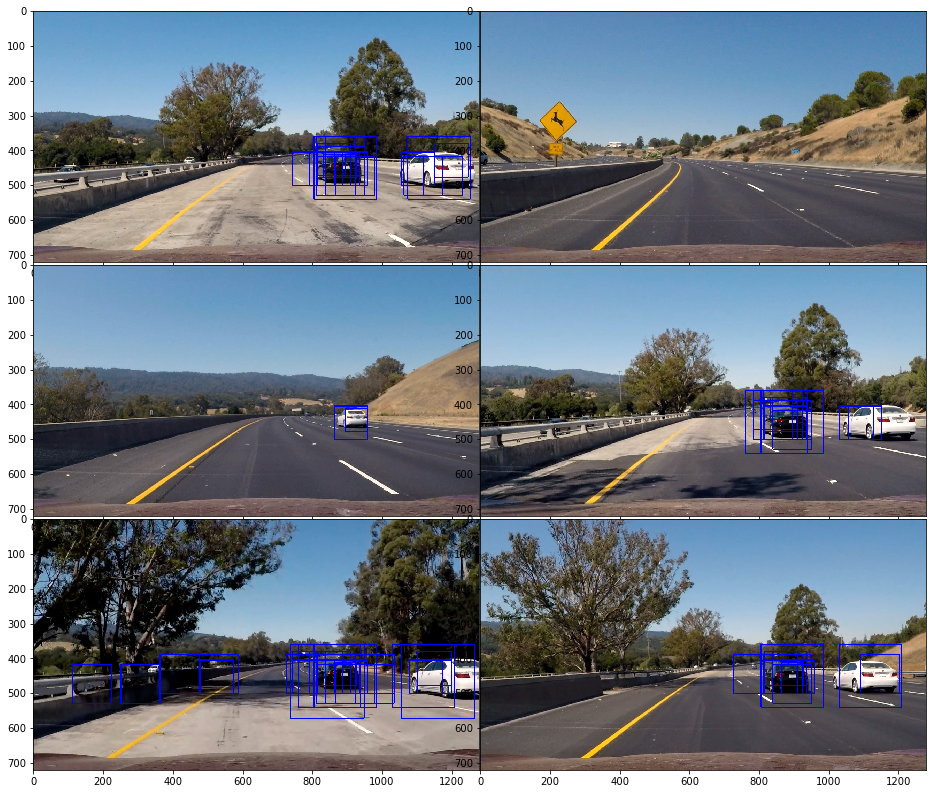

In [22]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    boxes_with_cars = process_image(test_img)
    test_img_rects = draw_boxes(test_img, boxes_with_cars, color=(0,0,255), thick=2)
    axs[i].imshow(test_img_rects)
plt.show()

### Create heatmap to reduce false positives

In [23]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    bounding_boxes_for_cars = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        bounding_boxes_for_cars.append(bbox)
    # Return the image
    return img, bounding_boxes_for_cars

from scipy.ndimage.measurements import label
def find_bounding_box_car(box_list,image):
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,box_list)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    return labels, heatmap

def get_car_bounding_box(test_img,return_heatmap = False):
    boxes_with_cars = process_image(test_img)
    labels, heatmap = find_bounding_box_car(boxes_with_cars, test_img)
    draw_img, boxes_for_cars = draw_labeled_bboxes(np.copy(test_img), labels)
    if return_heatmap:
        return draw_img, heatmap, boxes_for_cars, boxes_with_cars
    else:
        return draw_img

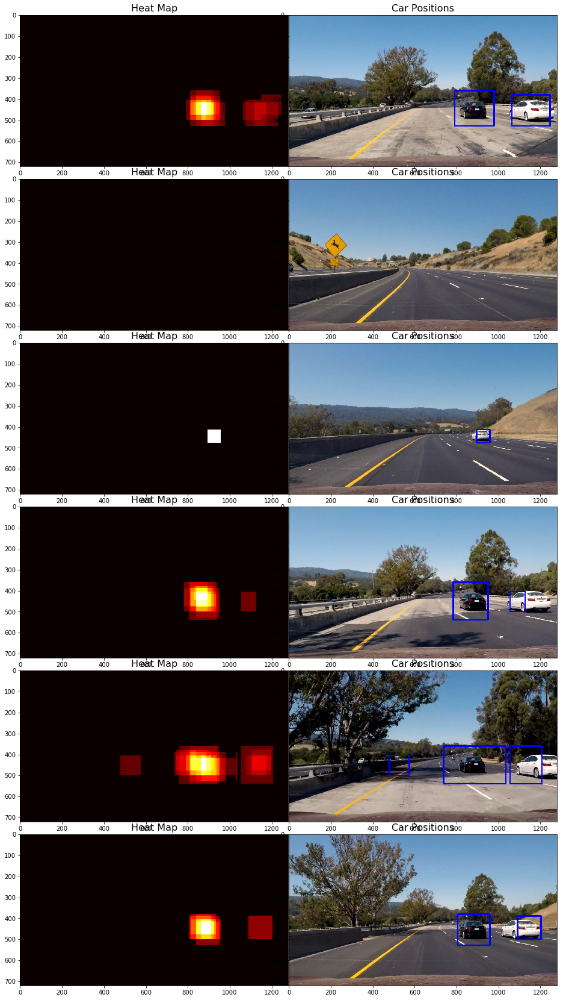

In [24]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(6, 2, figsize=(16,30))
fig.subplots_adjust(hspace = .004, wspace=.002)

for i, image_add in enumerate(test_images):
    test_img = mpimg.imread(image_add)
    draw_img, heatmap, bboxes, all_bboxes= get_car_bounding_box(test_img, return_heatmap = True)
    axs[i,1].imshow(draw_img)
    axs[i,1].set_title('Car Positions', fontsize=16)
    axs[i,0].imshow(heatmap, cmap='hot')
    axs[i,0].set_title('Heat Map', fontsize=16)

plt.show()

### Test image pipeline on test video

In [25]:
#Define input video object
cap = cv2.VideoCapture("test_video.mp4")

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('test_video_output.mp4',fourcc, 20.0, (test_img.shape[1], test_img.shape[0]))

frames_read = 0

fp = open('Bounding_box_info.txt', "w+")

while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == True:
        frames_read += 1
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        result, heatmap, boxes_for_cars, all_boxes_for_cars = get_car_bounding_box(frame,return_heatmap = True)
        fp.write(str(frames_read) + ',')
        for element in boxes_for_cars:
            fp.write(str(element))
        fp.write('\n')
        result = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
        out.write(result)
    else:
        break

# Release everything if job is finished
fp.close()
cap.release()
out.release()
cv2.destroyAllWindows()

### Test image pipeline on project video

In [667]:
#Define input video object
cap = cv2.VideoCapture("project_video.mp4")

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('project_video_output.mp4',fourcc, 20.0, (test_img.shape[1], test_img.shape[0]))

fp = open('Bounding_box_info2.txt', "w+")
fp2 = open('Bounding_box_info2_all.txt', "w+")

frames_read = 0
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == True:
        frames_read += 1
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        result, heatmap, boxes_for_cars, all_boxes_for_cars = get_car_bounding_box(frame,return_heatmap = True)
        fp.write(str(frames_read) + ',')
        for element in boxes_for_cars:
            fp.write(str(element))
        fp.write('\n')
        fp2.write(str(frames_read) + ',')
        for element in all_boxes_for_cars:
            fp2.write(str(element))
        fp2.write('\n')
        result = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
        out.write(result)
    else:
        break

# Release everything if job is finished
cap.release()
fp.close()
fp2.close()
out.release()
cv2.destroyAllWindows()

## Step4: Use time information for more robust prediction

To real life scenario following assumptions can be made

1. Vehicles if visible can last for few seconds in the camera.
2. The position of the vehicle (in the frames) will move but slowly with time.
3. If there is a vehcile, there will be positive detections from classifier not only in a single frame but also accross multiple frames.
4. Since The position of the vehicle (in the frames) will move but slowly with time, the size of the bounding box will also increase or decrease slowly.

Considering these assumpitions I implemented a clustering technique to achieve desired result. The technique works in the following manner

1. It consideres the latest 30 frames (1.5 seconds)
2. For these latest frames, it iterates over all the positive detections. 
3. Starting from first of 30 frames and first detected box, it calculates its center and stores it and weight of 1 is given. Also the x and y length are stored.
4. For every new box, it calculates its distance from existing center. If the distance is lower than a threshold, then it considers it close to existing center else it considers as a new center.
5. If current center is found close to existing center, the existing center and x,y lengths and weights are updated using the new center. 
6. This update is done by simple weighted averaging. Where weight of existing center is previous weight and new center as 1. X,Y lenghts are also updated in same manner. The new weight is 1 more than previous weight.
7. If the current center is found as a new center, the new center is added to list of all centers and weight of 1 is given. Also the x and y length of new center is stored.
8. For final selection, centers only with a weight greater than a certain threshold are considered. 


In [26]:
'''
Class to apply clustering to filter false positives and stabilize true detections
'''
# Define a class to store data from video
class Vehicle_Detect():
    frame_max = 30
    def __init__(self):
        # history of rectangles previous n frames
        self.prev_boxes_with_cars = [] 
        
    '''
    Function to add new detections to queue and remove last if queue > frame_max
    Inputs: Boxes for new detections in latest frame   
    '''
    def add_boxes_with_cars(self, boxes_with_cars):
        self.prev_boxes_with_cars.append(boxes_with_cars)
        if len(self.prev_boxes_with_cars) > self.frame_max:
            # throw out oldest rectangle set(s)
            self.prev_boxes_with_cars = self.prev_boxes_with_cars[len(self.prev_boxes_with_cars)-self.frame_max:]
            
    '''
    Function to get final boxes after applying clustering
    Output: Final Boxes after applying clustering
    '''
    def get_final_boxes(self):
        possible_centers = []
        weights = []
        possible_edge_lengths = []
        for frame_boxes in self.prev_boxes_with_cars:
            for boxes in frame_boxes:
                #get center
                center = self.get_center(boxes)
                
                #if first time, just append
                if len(possible_centers) == 0:
                    possible_centers, weights, possible_edge_lengths = self.add_to_existing(boxes, possible_centers, weights, possible_edge_lengths)
                else:
                    #If not first time, check with current centers
                    close_found = False
                    for i in range(0,possible_centers.shape[0]):
                        if self.check_if_close(center, possible_centers[i,:]):
                            possible_centers, weights, possible_edge_lengths = self.merge_with_existing(i, boxes, possible_centers, weights, possible_edge_lengths)
                            close_found = True
                            break
                    #if not close, append to existing array
                    if not close_found:
                        possible_centers, weights, possible_edge_lengths = self.add_to_existing(boxes, possible_centers, weights, possible_edge_lengths)
                        
        #Once loop is over create new array with boxes and edges only with weights greater than a threshold
        final_boxes = []
        for index, weight in enumerate(weights):
            if weight > 47:
                x_box1 = int(possible_centers[index,0] - possible_edge_lengths[index,0])
                x_box2 = int(possible_centers[index,0] + possible_edge_lengths[index,0])
                y_box1 = int(possible_centers[index,1] - possible_edge_lengths[index,1])
                y_box2 = int(possible_centers[index,1] + possible_edge_lengths[index,1])
                final_boxes.append(((x_box1,y_box1),(x_box2,y_box2)))
        
        #Return this new array
        return final_boxes
    
    '''
    Function to get center of a box
    Input: Box for which center has to be calculated
    Output: Center
    '''
    def get_center(self, box):
        cx = (box[0][0] + box[1][0])/2.0
        cy = (box[0][1] + box[1][1])/2.0
        return np.array([cx,cy])
    
    '''
    Function to check if two centers are close
    Input: 2 centers
    Output: Boolean
    '''
    def check_if_close(self, center1, center2):
        if (np.abs(center1[0] - center2[0])<100 and  np.abs(center1[1] - center2[1])<100):
            return True
        else:
            return False
    
    '''
    Function to merge new center with existing list of centers
    Input: Index of center which has to be merged with
           New Box to be merged
           List of existing centers
           List of existing weights
           List of existing edge lengths
    Output: new centers, new weights, new edge lengths
    '''
    def merge_with_existing(self, index, box, centers, weights, possible_edge_lengths):
        center = self.get_center(box)
        centers[index,0] = (centers[index,0]*weights[index] + center[0])/(weights[index] +1)
        centers[index,1] = (centers[index,1]*weights[index] + center[1])/(weights[index] +1)
        
        edge_x = np.abs(box[0][0] - box[1][0])
        edge_y = np.abs(box[0][1] - box[1][1])
        possible_edge_lengths[index,0] = (possible_edge_lengths[index,0]*weights[index] + edge_x)/(weights[index] +1)
        possible_edge_lengths[index,1] = (possible_edge_lengths[index,1]*weights[index] + edge_y)/(weights[index] +1)
        #possible_edge_lengths[index,0] = np.max([possible_edge_lengths[index,0],edge_x])
        #possible_edge_lengths[index,1] = np.max([possible_edge_lengths[index,1],edge_y])
        
        weights[index] += 1
        return centers, weights, possible_edge_lengths
    
    '''
    Function to add new center to existing list of centers
    Input: New Box to be merged
           List of existing centers
           List of existing weights
           List of existing edge lengths
    Output: Updated centers, Updated weights, Updated edge lengths
    '''
    def add_to_existing(self, box, centers, weights, possible_edge_lengths):
        if len(centers) == 0:
            centers = self.get_center(box).reshape(1,2)
            edge_x = np.abs(box[0][0] - box[1][0])
            edge_y = np.abs(box[0][1] - box[1][1])
            possible_edge_lengths = np.array([edge_x,edge_y]).reshape(1,2)
            weights = np.array([1])
        else:
            center = self.get_center(box)
            centers = np.concatenate((centers,center.reshape(1,2)),axis = 0)
            edge_x = np.abs(box[0][0] - box[1][0])
            edge_y = np.abs(box[0][1] - box[1][1])
            edges = np.array([edge_x,edge_y]).reshape(1,2)
            possible_edge_lengths = np.concatenate((possible_edge_lengths,edges),axis = 0)
            weights = np.concatenate((weights,np.array([1])),axis = 0)
            
        return centers, weights, possible_edge_lengths
    

In [27]:
'''
Function to detect cars in a video
Input: frame, object of Vehicle_Detect class
Output: frame with detection drawn as box, updated object of Vehicle_Detect class
'''
def detect_cars_in_video(frame, vehicle_detect):
    boxes_with_cars = process_image(frame)
    # add detections to the history
    if len(boxes_with_cars) > 0:
        vehicle_detect.add_boxes_with_cars(boxes_with_cars)
    final_boxes = vehicle_detect.get_final_boxes()
    
    #heatmap_img = np.zeros_like(frame[:,:,0])
    #for boxes in vehicle_detect.prev_boxes_with_cars:
    #    heatmap_img = add_heat(heatmap_img, boxes)
    #heatmap_img = apply_threshold(heatmap_img, 1 + len(vehicle_detect.prev_boxes_with_cars)//2)
     
    #labels = label(heatmap_img)
    #draw_img, boxes_in_cars = draw_labeled_bboxes(np.copy(frame), labels)
    draw_img = np.copy(frame)
    for bbox in final_boxes: 
        cv2.rectangle(draw_img, bbox[0], bbox[1], (0,0,255), 6)   
    return draw_img, vehicle_detect

In [28]:
'''
Function to create a new video showing detections
Inputs: input video name, output video
'''
def create_video(input_name,output_name):
    vehicle_detect_obj = Vehicle_Detect()
    #Define input video object
    cap = cv2.VideoCapture(input_name)

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_name,fourcc, 20.0, (test_img.shape[1], test_img.shape[0]))

    frames_read = 0
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret == True:
            frames_read += 1
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            result, vehicle_detect_obj = detect_cars_in_video(frame, vehicle_detect_obj)
            result = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
            out.write(result)
            if frames_read%10 == 0:
                print('On frame',frames_read,len(vehicle_detect_obj.prev_boxes_with_cars))
        else:
            break

    # Release everything if job is finished
    cap.release()
    out.release()
    cv2.destroyAllWindows()

In [685]:
create_video('test_video.mp4','test_video_output_with_hist.mp4')
print('Test video done.')


On frame 10 10
On frame 20 20
On frame 30 30
Test video done.


In [38]:
frame_index = 1020

#Define input video object
cap = cv2.VideoCapture('project_video.mp4')

vehicle_detect_obj = Vehicle_Detect()
frames_read = 0

latest_30_frames = []
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == True:
        frames_read += 1
        if frames_read >= (frame_index-30) and frames_read < frame_index:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            result, vehicle_detect_obj = detect_cars_in_video(frame, vehicle_detect_obj)
    
            boxes_with_cars = process_image(frame)
            for box in boxes_with_cars:
                cx = (box[0][0] + box[1][0])/2.0
                cy = (box[0][1] + box[1][1])/2.0
                cv2.circle(frame, (int(cx),int(cy)), 4, (0,255,0), thickness=2)
        
            latest_30_frames.append(frame)
    else:
        break

cap.release()
cv2.destroyAllWindows()

In [ ]:
fig, axs = plt.subplots(15,2, figsize=(16, 70))
axs = axs.ravel()

for i, frame in enumerate(latest_30_frames):
    axs[i].axis('off')
    axs[i].set_title('Frame'+str(frame_index+i), fontsize=10)
    axs[i].imshow(frame)
plt.show()

In [ ]:
plt.imshow(result)
plt.show()

In [686]:

create_video('project_video.mp4','project_video_output_with_hist.mp4')
print('Project video done.')

On frame 10 3
On frame 20 3
On frame 30 4
On frame 40 5
On frame 50 5
On frame 60 6
On frame 70 7
On frame 80 7
On frame 90 10
On frame 100 10
On frame 110 11
On frame 120 14
On frame 130 19
On frame 140 28
On frame 150 30
On frame 160 30
On frame 170 30
On frame 180 30
On frame 190 30
On frame 200 30
On frame 210 30
On frame 220 30
On frame 230 30
On frame 240 30
On frame 250 30
On frame 260 30
On frame 270 30
On frame 280 30
On frame 290 30
On frame 300 30
On frame 310 30
On frame 320 30
On frame 330 30
On frame 340 30
On frame 350 30
On frame 360 30
On frame 370 30
On frame 380 30
On frame 390 30
On frame 400 30
On frame 410 30
On frame 420 30
On frame 430 30
On frame 440 30
On frame 450 30
On frame 460 30
On frame 470 30
On frame 480 30
On frame 490 30
On frame 500 30
On frame 510 30
On frame 520 30
On frame 530 30
On frame 540 30
On frame 550 30
On frame 560 30
On frame 570 30
On frame 580 30
On frame 590 30
On frame 600 30
On frame 610 30
On frame 620 30
On frame 630 30
On frame 